In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
import datetime as dt

In [4]:
from IPython.display import display

# Introduction

In [5]:
indexes = ['nifty 50', 'nifty 100', 'nifty 200', 'nifty 500', 'nifty midcap 50', 'nifty midcap 100', 'nifty midcap 150',
           'nifty smallcap 50', 'nifty smallcap 100', 'nifty smallcap 250']

The Indices are Total Returns Indices, which includes dividend payments for calculation of index value.
https://www.nseindia.com/products-services/indices-total-returns-index

In [6]:
nifty = pd.read_excel(indexes[0]+'.xlsx', index_col='Date')
nifty.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2820 entries, 2011-01-03 to 2022-05-20
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Total Returns Index  2820 non-null   float64
 1   P/E                  2820 non-null   float64
 2   P/B                  2820 non-null   float64
 3   Div Yield            2820 non-null   float64
dtypes: float64(4)
memory usage: 110.2 KB


In [7]:
nifty.tail()

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2022-05-16,22815.88,19.72,4.05,1.35
2022-05-17,23416.46,20.12,4.15,1.31
2022-05-18,23389.07,20.09,4.15,1.31
2022-05-19,22768.49,19.51,4.04,1.35
2022-05-20,23426.36,20.05,4.16,1.31


In [8]:
nifty.describe()

,Total Returns Index,P/E,P/B,Div Yield
count,2820.000000,2820.000000,2820.000000,2820.000000
mean,12688.698287,23.413408,3.424330,1.313670
std,5186.513675,4.927036,0.431523,0.166199
min,5763.880000,15.230000,2.170000,0.930000
25%,7906.320000,19.420000,3.100000,1.210000
50%,11497.715000,22.690000,3.410000,1.290000
75%,15495.150000,26.430000,3.630000,1.450000
max,26467.210000,42.000000,4.630000,2.000000


In [9]:
nifty[nifty.duplicated(keep=False)]

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2014-05-13,9267.61,19.67,3.38,1.36
2014-05-14,9267.61,19.67,3.38,1.36


Cumulative Annual Growth Rate calculation

In [10]:
def cagr_calc(df, start, end):
    start  = dt.datetime(*start)
    if start < dt.datetime(2011,1,1) or start > df.index[-1]:
        return print(f"start value should be between {df.index[0].date()} and {df.index[-1].date()}")
    
    initial_value = None
    while not initial_value:
        try:
            initial_value = df.loc[start]['Total Returns Index']
        except KeyError:
            start += dt.timedelta(days=1)
    
    end  = dt.datetime(*end)
    if end < df.index[0]:
        return print(f"end value should be greater than {df.index[0].date()}")
    
    final_value = None
    while not final_value:
        try:
            final_value = df.loc[end]['Total Returns Index']
        except KeyError:
            end -= dt.timedelta(days=1)
        
    r = (df.loc[end]['Total Returns Index']/df.loc[start]['Total Returns Index'])**(1/((end-start).days/365))-1
    return round(r*100, 2), f'between {start.date()} and {end.date()}'

In [11]:
cagr = cagr_calc(nifty, (2022,1,1), (2022,5,20))
cagr

(-18.52, 'between 2022-01-03 and 2022-05-20')

# Data Visualization

In [12]:
nifty['day'] = nifty.index.day_name()
nifty.groupby(nifty['day']).count()

,Total Returns Index,P/E,P/B,Div Yield
day,,,,
Friday,554,554,554,554
Monday,563,563,563,563
Saturday,9,9,9,9
Sunday,3,3,3,3
Thursday,560,560,560,560
Tuesday,566,566,566,566
Wednesday,565,565,565,565


<AxesSubplot:>

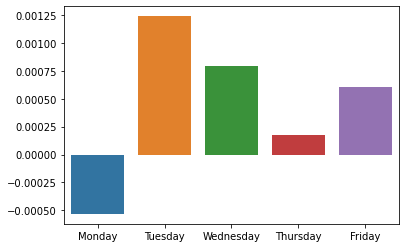

In [13]:
dd = nifty['Total Returns Index'].pct_change().groupby(nifty['day']).mean()
days = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']
dd.index = pd.Categorical(dd.index, categories=days[:5], ordered=True)
sns.barplot(x=dd.index, y=dd.values)

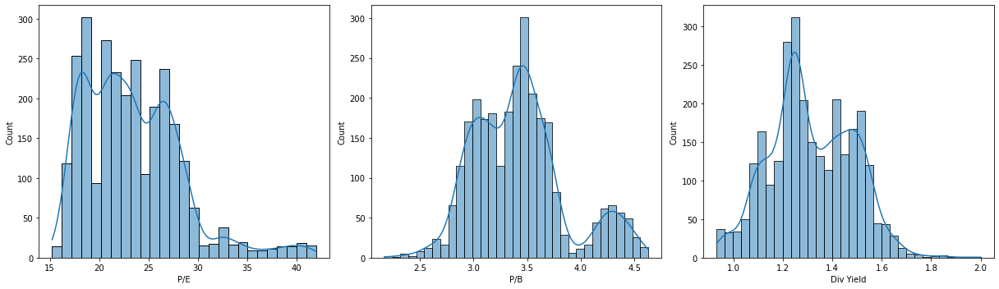

In [14]:
fig, axes = plt.subplots(1,3, figsize=(17,5))
for i, ax in enumerate(axes):
    sns.histplot(nifty[nifty.columns[i+1]], ax=ax, kde=True)
plt.tight_layout()

Percentage of days with positive returns

In [15]:
nifty[nifty['Total Returns Index'].pct_change() > 0].count()[0] / nifty['Total Returns Index'].count() * 100

53.333333333333336

Daily average returns

In [16]:
nifty['Total Returns Index'].pct_change().mean() * 100

0.04548767270152892

In [17]:
nifty['Total Returns Index'].pct_change().std() * 100

1.10474875108609

Median return

In [18]:
nifty['Total Returns Index'].pct_change().median() * 100

0.058885146474985106

Text(0.5, 0, 'percentage change for every day')

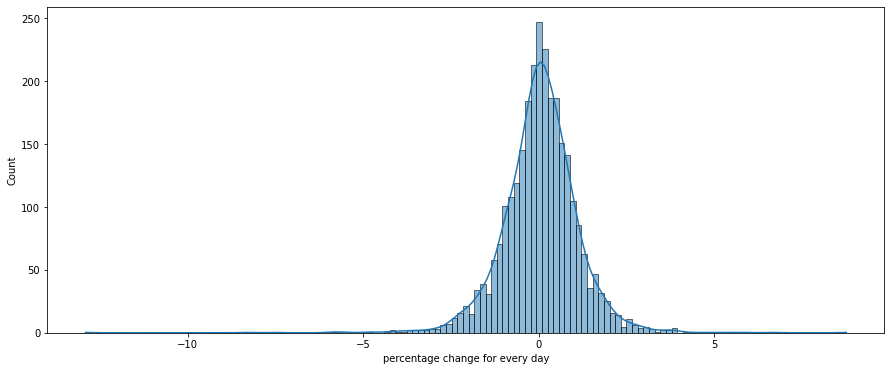

In [19]:
plt.figure(figsize=(15,6))
sns.histplot(nifty['Total Returns Index'].pct_change() * 100, kde=True)
plt.xlabel('percentage change for every day')

Number of Trading days in each year

In [20]:
values, counts = np.unique(nifty.index.year, return_counts=True)

In [21]:
values

array([2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
       2022], dtype=int64)

In [22]:
counts

array([247, 251, 250, 244, 248, 247, 248, 246, 245, 252, 248,  94],
      dtype=int64)

average number of trading days excluding current year

In [23]:
counts[:-1].mean()

247.8181818181818

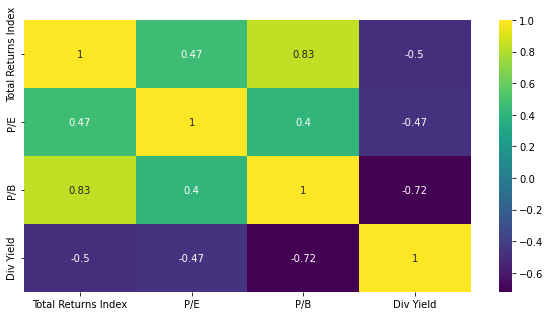

In [24]:
plt.figure(figsize=(10,5))
ax = sns.heatmap(data=nifty[1000:].corr(), annot=True, cmap='viridis')

## lineplots

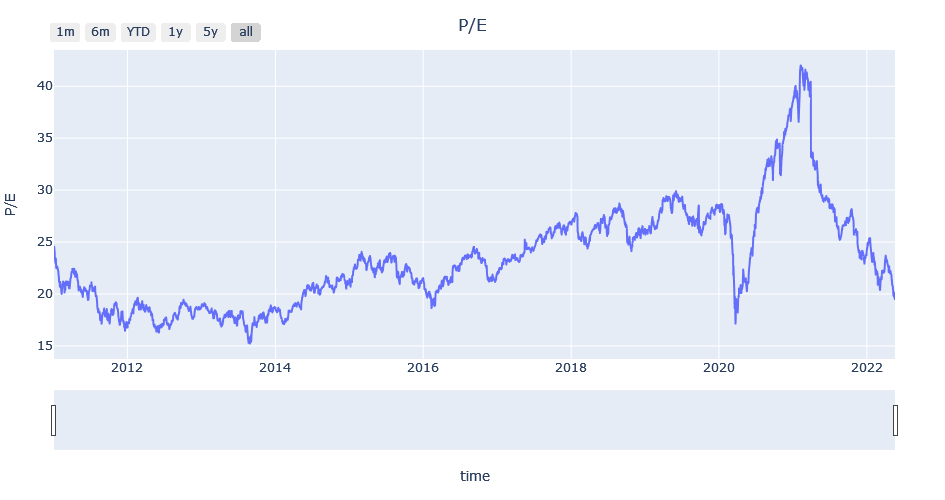

In [25]:
fig = px.line(nifty, x=nifty.index, y="P/E", title='P/E', height=500)
fig.update_layout(
    title={'text': "P/E", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='P/E', margin=dict(l=50, r=50, b=50, t=50))
fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))

fig.show()

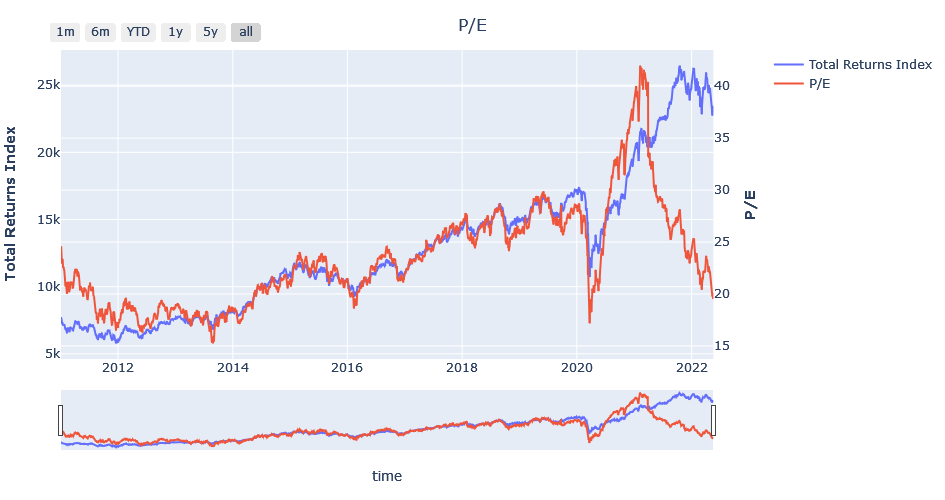

In [26]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E'), secondary_y=True)
fig.update_layout(
    title={'text': "P/E", 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)
fig.update_xaxes(rangeslider_visible=True, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>Total Returns Index</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=True)
fig.show()

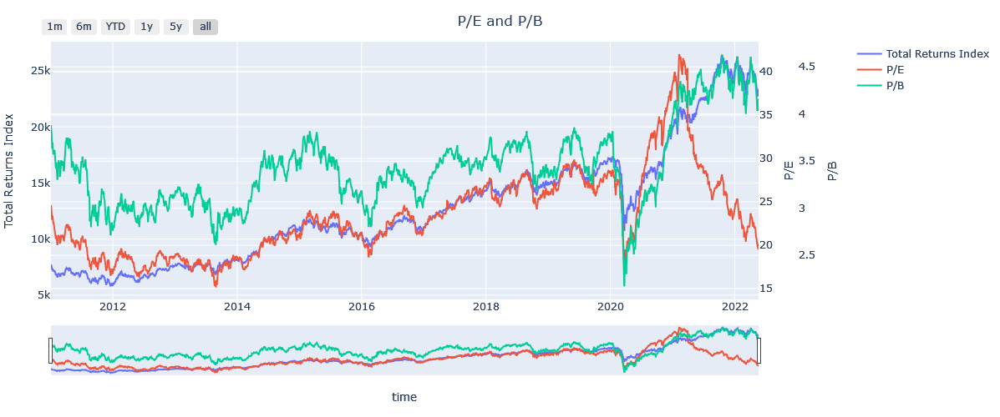

In [27]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=nifty.index, y=nifty["Total Returns Index"], name='Total Returns Index'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/E"], name='P/E', yaxis='y2'))
fig.add_trace(go.Scatter(x=nifty.index, y=nifty["P/B"], name='P/B', yaxis='y3'))

fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                  yaxis=dict(title="Total Returns Index"), yaxis2=dict(title = 'P/E', anchor="x", overlaying="y", side="right"),
                  yaxis3=dict(title = 'P/B', anchor="free", overlaying="y", side="right", position=.95),
    title={'text': "P/E and P/B", 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

fig.update_xaxes(rangeslider_visible=True, 
                 rangeselector=dict(buttons=list([
                    dict(count=1, label="1m", step="month", stepmode="backward"),
                    dict(count=6, label="6m", step="month", stepmode="backward"),
                    dict(count=1, label="YTD", step="year", stepmode="todate"),
                    dict(count=1, label="1y", step="year", stepmode="backward"),
                    dict(count=5, label="5y", step="year", stepmode="backward"),
                    dict(step="all")])))

fig.show()

## relative comparison of multiple indexes

In [28]:
def compare_indices(indices, from_date=(2011,1,1)):
    fig = go.Figure()
    for i in indices:
        df = pd.read_excel(i + '.xlsx', index_col='Date')
        df = df.loc[dt.datetime(*from_date):]
        fig.add_trace(go.Scatter(x=df.index, y=df['Total Returns Index']/df['Total Returns Index'][0]*100, name=i+' Total Returns Index'))

    fig.update_layout(
        title={'text': "relative index", 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'},  xaxis_title='time', yaxis_title='Index', margin=dict(l=50, r=50, b=50, t=50))

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeselector=dict(buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.show()

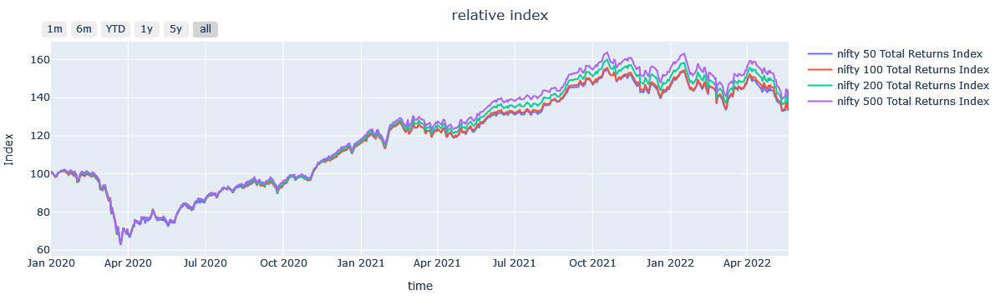

In [29]:
compare_indices(indexes[:4], from_date=(2020,1,1))

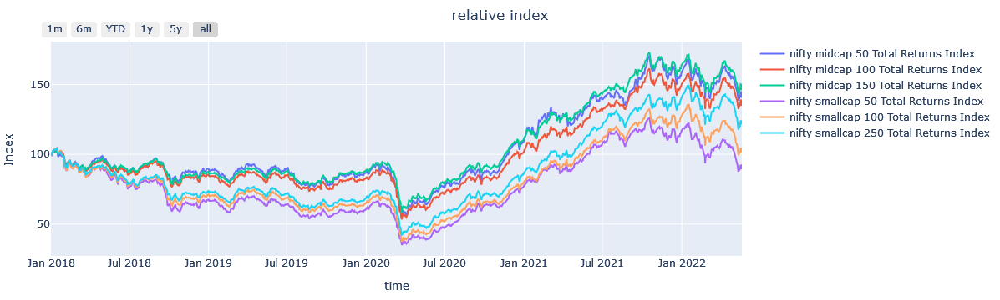

In [30]:
compare_indices(indexes[4:], from_date=(2018,1,1))

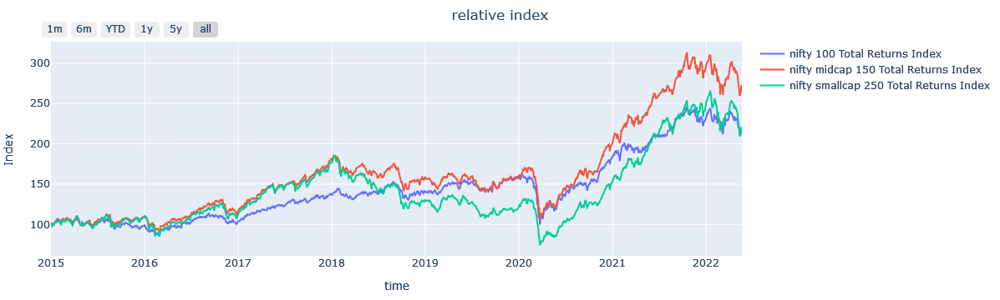

In [31]:
compare_indices([indexes[i] for i in [1,6,9]], from_date=(2015,1,1))

## two indices, two metrics

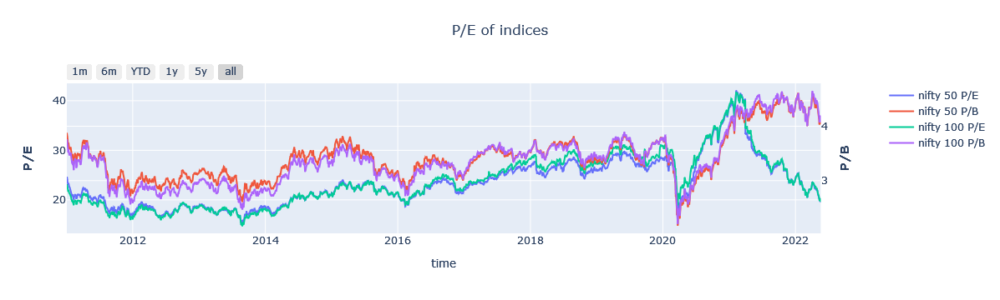

In [32]:
fig = go.Figure()
fig = make_subplots(specs=[[{"secondary_y": True}]])
for i in indexes[:2]:
    nifty = pd.read_excel(i + '.xlsx', index_col='Date')
    
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/E'], name=i+' P/E'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty['P/B'], name=i+' P/B'), secondary_y=True)
    
fig.update_layout(title={'text': "P/E of indices", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'middle'}, xaxis_title='time')

fig.update_layout(hovermode="x unified")

fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(step="all")
        ])))
fig.update_yaxes(title_text="<b>P/E</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>P/B</b>", secondary_y=True)
fig.update_yaxes(fixedrange=False)

fig.show()

In [33]:
def multiple_indices_two_metrics(indices, metric_1, metric_2):
    fig = go.Figure()
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    for i in indices:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')

        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric_1], name=i + metric_1))
        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric_2], name=i + metric_2), secondary_y=True)

    fig.update_layout(title={'text': metric_1 + ' ' + metric_2 + " of indices", 'y':0.9, 'x':0.5, 'xanchor': 'center', 'yanchor': 'middle'}, xaxis_title='time')

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.update_yaxes(title_text = metric_1, secondary_y=False)
    fig.update_yaxes(title_text = metric_2, secondary_y=True)
    fig.update_yaxes(fixedrange=False)

    fig.show()

In [34]:
[indexes[i] for i in [1,6,9]]

['nifty 100', 'nifty midcap 150', 'nifty smallcap 250']

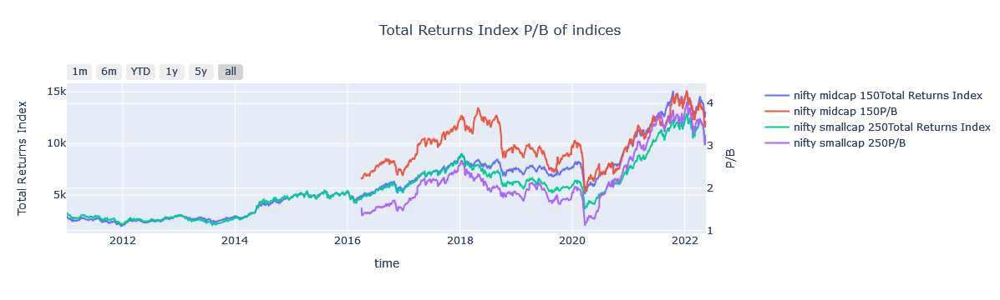

In [35]:
multiple_indices_two_metrics([indexes[i] for i in [6,9]], 'Total Returns Index', 'P/B')

## compare multiple indices with one metric

In [36]:
def compare_indices_metrics(indices, metric):
    fig = go.Figure()
    for i in indices:
        nifty = pd.read_excel(i + '.xlsx', index_col='Date')
        fig.add_trace(go.Scatter(x=nifty.index, y=nifty[metric], name=i[6:]+' '+metric))
    
    fig.update_layout(
        title={'text': metric + ' of indices', 'x':0.5, 'y':0.95, 'xanchor':'center', 'yanchor':'middle'}, 
        xaxis_title='time', yaxis_title=metric, margin=dict(l=50, r=50, b=50, t=50))
    
    fig.update_layout(hovermode="x unified")
    
    fig.update_xaxes(rangeslider_visible=False, rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(count=5, label="5y", step="year", stepmode="backward"),
                dict(step="all")
            ])))
    fig.show()

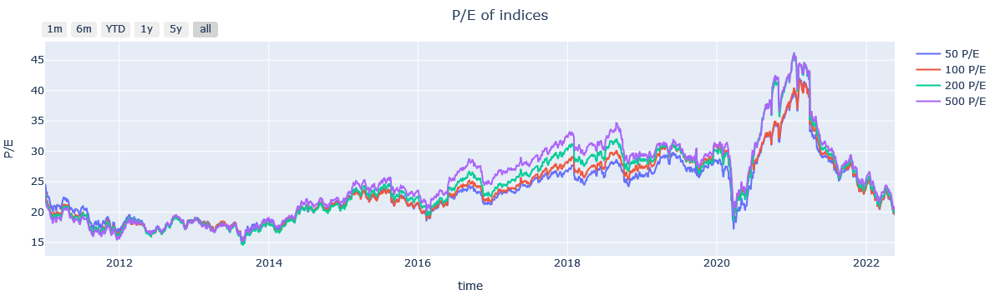

In [37]:
compare_indices_metrics(indexes[:4], 'P/E')

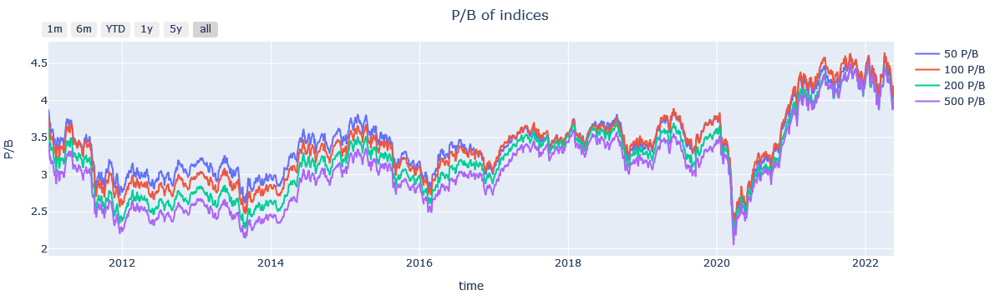

In [38]:
compare_indices_metrics(indexes[:4], 'P/B')

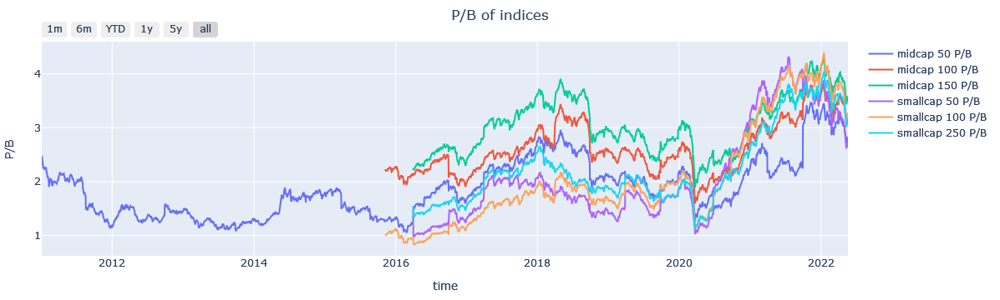

In [39]:
compare_indices_metrics(indexes[4:], 'P/B')

In [40]:
[indexes[i] for i in [1,6,9]]

['nifty 100', 'nifty midcap 150', 'nifty smallcap 250']

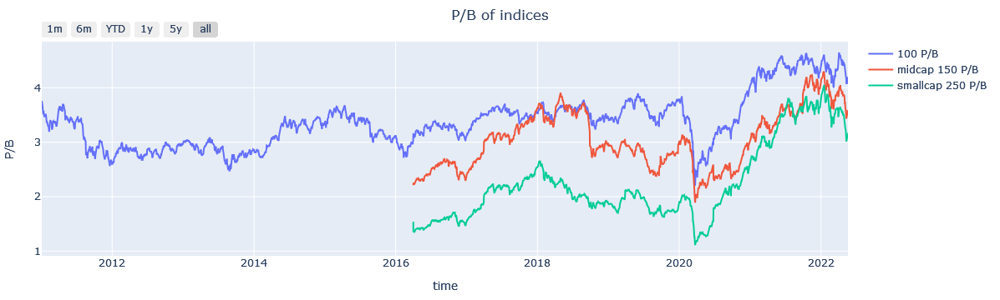

In [41]:
compare_indices_metrics([indexes[i] for i in [1,6,9]], 'P/B')

# yealy returns

In [42]:
cagr_list = []

In [43]:
for i in indexes:
    df_index = pd.read_excel(i+'.xlsx', index_col='Date')
    for j in range(2011,2023):
        cagr_list.append(cagr_calc(df_index, (j,1,1), (j,12,31))[0])

In [44]:
np.reshape(cagr_list, (10, 12))

array([[-2.433e+01,  2.918e+01,  7.260e+00,  3.305e+01, -3.040e+00,
         4.190e+00,  3.075e+01,  5.610e+00,  1.302e+01,  1.601e+01,
         2.534e+01, -1.852e+01],
       [-2.544e+01,  3.236e+01,  7.000e+00,  3.494e+01, -1.320e+00,
         4.670e+00,  3.319e+01,  3.400e+00,  1.148e+01,  1.597e+01,
         2.611e+01, -1.873e+01],
       [-2.664e+01,  3.349e+01,  4.980e+00,  3.732e+01, -8.700e-01,
         4.670e+00,  3.543e+01,  1.040e+00,  9.710e+00,  1.670e+01,
         2.842e+01, -1.925e+01],
       [-2.704e+01,  3.341e+01,  3.900e+00,  3.924e+01,  4.000e-02,
         4.690e+00,  3.775e+01, -1.560e+00,  8.670e+00,  1.770e+01,
         3.105e+01, -2.062e+01],
       [-4.022e+01,  3.676e+01, -2.980e+00,  4.645e+01,  2.900e+00,
         6.590e+00,  5.199e+01, -1.010e+01, -3.610e+00,  2.599e+01,
         4.279e+01, -2.575e+01],
       [-3.080e+01,  4.195e+01, -4.820e+00,  5.724e+01,  7.330e+00,
         7.180e+00,  4.857e+01, -1.454e+01, -3.500e+00,  2.273e+01,
         4.592e+01,

In [45]:
returns_by_year = pd.DataFrame(np.reshape(cagr_list, (10, 12)), columns=list(range(2011,2023)), index=indexes)
returns_by_year

,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
nifty 50,-24.33,29.18,7.26,33.05,-3.04,4.19,30.75,5.61,13.02,16.01,25.34,-18.52
nifty 100,-25.44,32.36,7.00,34.94,-1.32,4.67,33.19,3.40,11.48,15.97,26.11,-18.73
nifty 200,-26.64,33.49,4.98,37.32,-0.87,4.67,35.43,1.04,9.71,16.70,28.42,-19.25
nifty 500,-27.04,33.41,3.90,39.24,0.04,4.69,37.75,-1.56,8.67,17.70,31.05,-20.62
nifty midcap 50,-40.22,36.76,-2.98,46.45,2.90,6.59,51.99,-10.10,-3.61,25.99,42.79,-25.75
nifty midcap 100,-30.80,41.95,-4.82,57.24,7.33,7.18,48.57,-14.54,-3.50,22.73,45.92,-22.65
nifty midcap 150,-31.91,47.34,-2.45,62.00,9.30,5.48,55.11,-12.52,0.58,25.12,46.63,-24.76
nifty smallcap 50,-40.48,35.07,-10.59,63.10,3.13,-1.03,54.11,-32.60,-10.53,26.12,50.30,-50.01
nifty smallcap 100,-33.94,38.64,-8.28,54.39,7.05,2.11,56.70,-29.09,-8.95,21.90,59.06,-44.32
nifty smallcap 250,-36.09,40.22,-7.66,69.64,9.99,0.52,56.87,-26.60,-7.61,25.55,61.69,-30.84


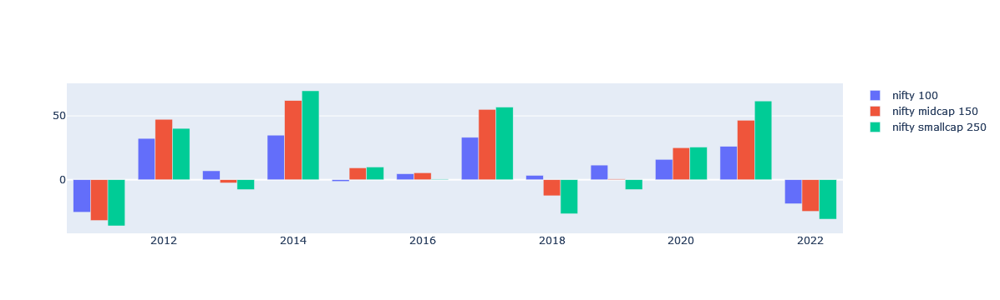

In [46]:
years=list(range(2011,2023))

fig = go.Figure(data=[
    go.Bar(name='nifty 100', x=years, y=returns_by_year.loc['nifty 100'].to_list()),
    go.Bar(name='nifty midcap 150', x=years, y=returns_by_year.loc['nifty midcap 150'].to_list()),
    go.Bar(name='nifty smallcap 250', x=years, y=returns_by_year.loc['nifty smallcap 250'].to_list())
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

In [47]:
returns_by_year = pd.melt(returns_by_year.reset_index(), id_vars=['index'], var_name='year', value_name='return')

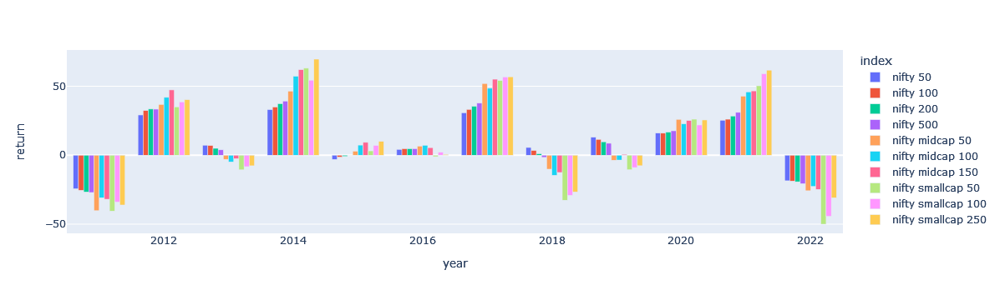

In [48]:
fig = px.bar(returns_by_year, x='year', y='return', color='index')
fig.update_layout(barmode='group')
fig.show()

<AxesSubplot:xlabel='year', ylabel='return'>

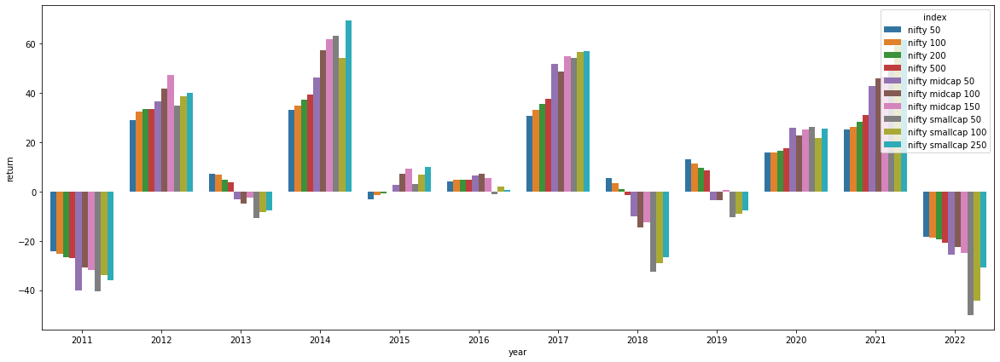

In [49]:
plt.figure(figsize=(20,7))
sns.barplot(data=returns_by_year, x='year', y='return', hue='index')

In [50]:
np.unique(nifty.index.year, return_counts=True)

(array([2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021,
        2022], dtype=int64),
 array([247, 251, 250, 244, 248, 247, 248, 246, 245, 252, 248,  94],
       dtype=int64))

In [51]:
for i in range(11):
    print(nifty.index[i*248])

2011-01-03 00:00:00
2012-01-03 00:00:00
2012-12-28 00:00:00
2013-12-26 00:00:00
2015-01-01 00:00:00
2016-01-01 00:00:00
2017-01-03 00:00:00
2018-01-02 00:00:00
2019-01-04 00:00:00
2020-01-09 00:00:00
2021-01-05 00:00:00


In [52]:
nifty_yearly = pd.DataFrame()

In [53]:
nifty_yearly['last 1 year returns'] = nifty['Total Returns Index'].pct_change(periods=248)

In [54]:
nifty_yearly['last 2 year returns'] = nifty['Total Returns Index'].pct_change(periods=248*2)

In [55]:
nifty_yearly['last 3 year returns'] = nifty['Total Returns Index'].pct_change(periods=248*3)

In [56]:
nifty_yearly['last 4 year returns'] = nifty['Total Returns Index'].pct_change(periods=248*4)

In [57]:
nifty_yearly['last 5 year returns'] = nifty['Total Returns Index'].pct_change(periods=248*5)

In [58]:
nifty_yearly['next 1 year returns'] = nifty_yearly['last 1 year returns'].shift(periods=-248)

In [59]:
nifty_yearly['next 2 year returns'] = nifty_yearly['last 2 year returns'].shift(periods=-248*2)

In [60]:
nifty_yearly['next 3 year returns'] = nifty_yearly['last 3 year returns'].shift(periods=-248*3)

In [61]:
nifty_yearly['next 4 year returns'] = nifty_yearly['last 4 year returns'].shift(periods=-248*4)

In [62]:
nifty_yearly['next 5 year returns'] = nifty_yearly['last 5 year returns'].shift(periods=-248*5)

In [63]:
nifty_yearly = nifty_yearly*100

In [64]:
nifty_with_returns = pd.concat([nifty, nifty_yearly], axis=1)

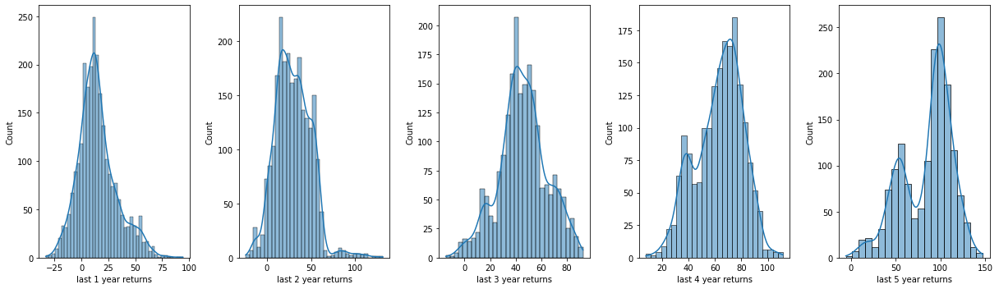

In [65]:
fig, axes = plt.subplots(1,5, figsize=(17,5))
for i, ax in enumerate(axes):
    sns.histplot(nifty_yearly.iloc[:,i], ax=ax, kde=True)
plt.tight_layout()

yearly correlations between returns and metric

In [66]:
for i in range(0, nifty['P/B'].count(), 248):
    print(f"On {nifty.index[i].date()} next 1 year returns are {round(nifty_yearly['next 1 year returns'].iloc[i], 2)} and correlation between P/B and returns is {round(nifty['P/B'].iloc[i:i+248].corr(nifty_yearly['next 1 year returns'].iloc[i:i+248]),2)}")

On 2011-01-03 next 1 year returns are -22.95 and correlation between P/B and returns is -0.94
On 2012-01-03 next 1 year returns are 28.6 and correlation between P/B and returns is -0.67
On 2012-12-28 next 1 year returns are 7.38 and correlation between P/B and returns is -0.82
On 2013-12-26 next 1 year returns are 35.64 and correlation between P/B and returns is -0.94
On 2015-01-01 next 1 year returns are -0.98 and correlation between P/B and returns is -0.87
On 2016-01-01 next 1 year returns are 5.02 and correlation between P/B and returns is -0.41
On 2017-01-03 next 1 year returns are 31.39 and correlation between P/B and returns is -0.46
On 2018-01-02 next 1 year returns are 2.03 and correlation between P/B and returns is -0.72
On 2019-01-04 next 1 year returns are 13.78 and correlation between P/B and returns is -0.53
On 2020-01-09 next 1 year returns are 17.76 and correlation between P/B and returns is -0.81
On 2021-01-05 next 1 year returns are 27.83 and correlation between P/B a

In [67]:
nifty['P/E'].iloc[:1000].corr(nifty_yearly['next 1 year returns'].iloc[:1000])

-0.6839329079930122

In [68]:
nifty['P/E'].iloc[1000:].corr(nifty_yearly['next 1 year returns'].iloc[1000:])

0.052641498594080065

In [69]:
nifty['Div Yield'].corr(nifty_yearly['next 1 year returns'])

0.5436580392986572

In [70]:
def compare_three(y1, y2, y3):
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y1], name=y1))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y2], name=y2, yaxis='y2'))
    fig.add_trace(go.Scatter(x=nifty.index, y=nifty_with_returns[y3], name=y3, yaxis='y3'))

    fig.update_layout(xaxis=dict(domain=[0.0, 0.9]),
                      yaxis=dict(title=y1), 
                      yaxis2=dict(title = y2, anchor="x", overlaying="y", side="right"),
                      yaxis3=dict(title = y3, anchor="free", overlaying="y", side="right", position=.95),
        title={'text': y1+' '+y2+' '+y3, 'x':0.5,'y':0.95, 'xanchor':'center','yanchor':'middle'},xaxis_title='time', margin=dict(l=50, r=50, b=50, t=50), height=500)

    fig.update_layout(hovermode="x unified")

    fig.update_xaxes(rangeslider_visible=True, 
                     rangeselector=dict(buttons=list([
                        dict(count=1, label="1m", step="month", stepmode="backward"),
                        dict(count=6, label="6m", step="month", stepmode="backward"),
                        dict(count=1, label="YTD", step="year", stepmode="todate"),
                        dict(count=1, label="1y", step="year", stepmode="backward"),
                        dict(count=5, label="5y", step="year", stepmode="backward"),
                        dict(step="all")])))
    fig.show()

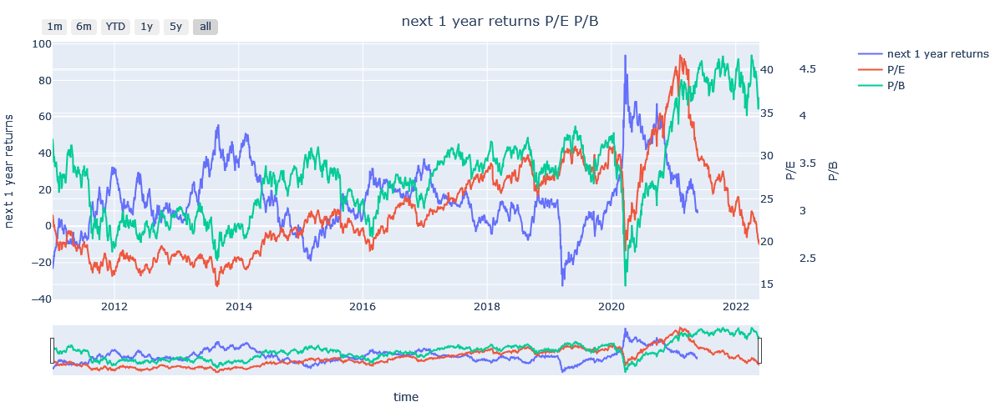

In [71]:
compare_three('next 1 year returns', 'P/E', 'P/B')

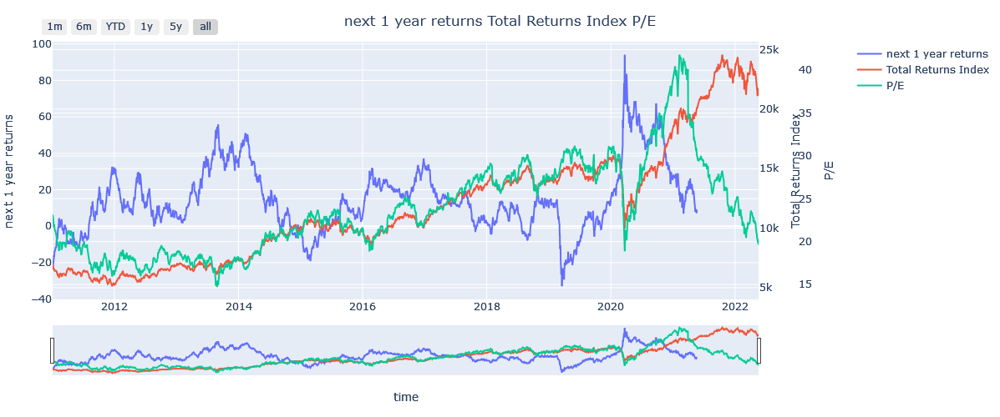

In [72]:
compare_three('next 1 year returns', 'Total Returns Index', 'P/E')

<AxesSubplot:>

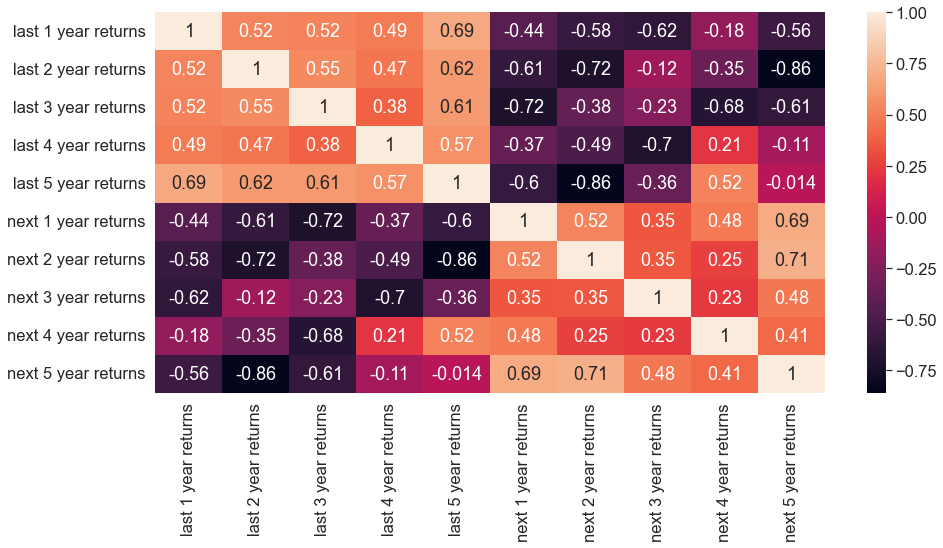

In [73]:
plt.figure(figsize = (15,7))
sns.set(font_scale=1.5)
sns.heatmap(nifty_yearly.corr(), annot=True)

In [74]:
nifty_with_returns.iloc[1000:, :]

,Total Returns Index,P/E,P/B,Div Yield,last 1 year returns,last 2 year returns,last 3 year returns,last 4 year returns,last 5 year returns,next 1 year returns,next 2 year returns,next 3 year returns,next 4 year returns,next 5 year returns
Date,,,,,,,,,,,,,,
2015-01-13,10005.12,21.13,3.35,1.23,38.173562,43.921494,83.782850,54.663023,NaN,-6.042306,6.768335,39.713667,41.082166,58.005201
2015-01-14,9982.57,21.07,3.35,1.24,37.569180,43.694473,82.041439,56.912512,NaN,-6.232263,7.253944,40.640036,41.568454,57.634757
2015-01-15,10223.17,21.58,3.43,1.21,41.189770,47.809925,86.053076,60.877249,NaN,-9.838925,4.568446,36.534265,38.057863,54.971501
2015-01-16,10254.25,21.64,3.44,1.20,41.618030,46.416078,83.265419,59.602948,NaN,-11.375869,4.554989,37.219397,38.182705,55.441207
2015-01-19,10297.97,21.69,3.45,1.20,40.298363,46.306039,84.622570,60.912067,NaN,-10.721433,4.357849,36.671985,37.238699,53.227675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-16,21216.91,19.86,4.09,1.44,7.545502,81.368704,47.990090,51.553579,75.158900,NaN,NaN,NaN,NaN,NaN
2022-05-17,21770.46,20.19,4.20,1.40,8.977188,82.298571,50.673344,55.617442,78.776103,NaN,NaN,NaN,NaN,NaN
2022-05-18,21753.74,20.17,4.19,1.40,9.267342,81.165674,48.666367,55.637880,77.590974,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:>

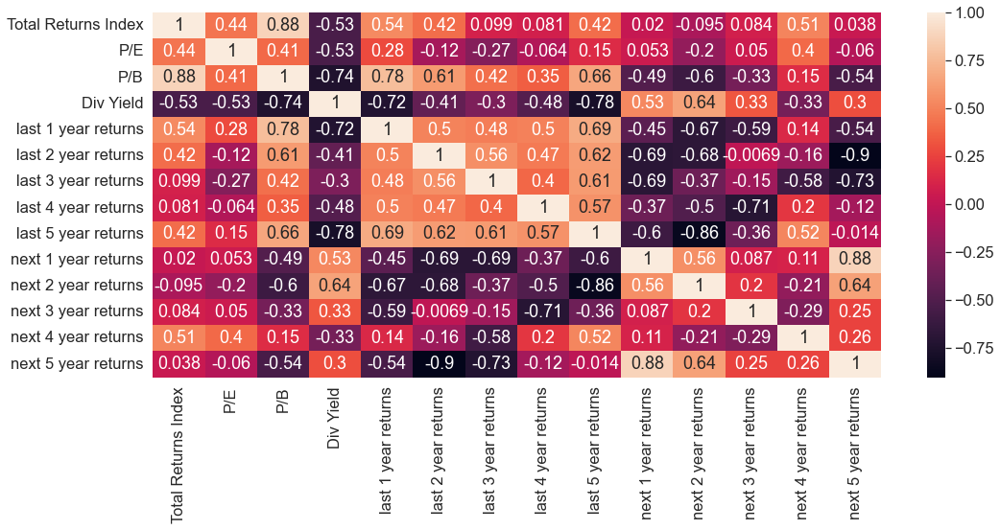

In [75]:
plt.figure(figsize = (17,7))
sns.set(font_scale=1.5)
sns.heatmap(nifty_with_returns.iloc[1000:, :].corr(), annot=True)

# Linear Regression

In [116]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

In [176]:
data_set = nifty_with_returns[['P/E', 'P/B', 'Div Yield','next 2 year returns']]

In [177]:
X = data_set[2000:].dropna()[['P/E', 'P/B', 'Div Yield']]
Y = data_set[2000:].dropna()['next 2 year returns']

In [178]:
scale = StandardScaler(with_mean=False)

In [179]:
X = scale.fit_transform(X)

In [180]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=101)

In [181]:
model = LinearRegression()

In [182]:
model.fit(X_train, Y_train)

LinearRegression()

In [183]:
model.coef_

array([-4.52934548,  8.21294561, 23.29061555])

In [184]:
model.score(X_test, Y_test)

0.9444554431023524

In [185]:
pred = model.predict(X_test)

<AxesSubplot:ylabel='next 2 year returns'>

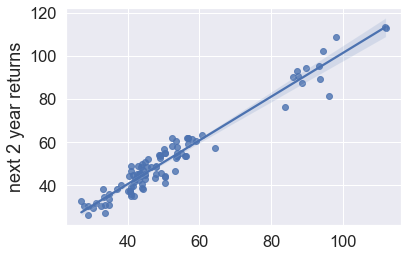

In [186]:
sns.regplot(x=pred, y=Y_test)

In [187]:
nifty.tail(1)

,Total Returns Index,P/E,P/B,Div Yield
Date,,,,
2022-05-20,21741.71,20.15,4.19,1.4


In [188]:
nifty.tail(1).iloc[:, 1:4]

,P/E,P/B,Div Yield
Date,,,
2022-05-20,20.15,4.19,1.4


In [189]:
scale.transform(nifty.tail(1).iloc[:, 1:4])

array([[ 7.52115992, 10.70481724,  8.00033758]])

In [190]:
model.predict(scale.transform(nifty.tail(1).iloc[:, 1:4]))

array([95.42534566])